In [27]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from datetime import datetime
import os

In [30]:
csv_files = os.listdir('dataset/1724917299/')
df = pd.read_csv(f'dataset/1724917299/{csv_files[0]}')
for csv_file in csv_files[1:]:
    temp_df = pd.read_csv(f'dataset/1724917299/{csv_file}')
    df = pd.concat([df, temp_df], axis=0)
del temp_df
df.reset_index(drop=True, inplace=True)
df.head()

,machine,time,axialAxisRmsVibration,radialAxisKurtosis,radialAxisPeakAcceleration,radialAxisRmsAcceleration,radialAxisRmsVibration,temperature
0,Blower-Pump-1,2024-08-08T07:43:00Z,1.253,3.430,0.864,0.190,2.076,55.1
1,Blower-Pump-1,2024-08-08T07:44:00Z,1.253,3.430,0.864,0.190,2.076,55.1
2,Blower-Pump-1,2024-08-08T07:45:00Z,1.253,3.430,0.864,0.190,2.076,55.1
3,Blower-Pump-1,2024-08-08T07:46:00Z,0.866,3.099,0.694,0.182,1.169,55.1
4,Blower-Pump-1,2024-08-08T07:47:00Z,0.866,3.099,0.694,0.182,1.169,55.1


In [31]:
df.tail()

,machine,time,axialAxisRmsVibration,radialAxisKurtosis,radialAxisPeakAcceleration,radialAxisRmsAcceleration,radialAxisRmsVibration,temperature
68756,Vacuum-Pump-4,2024-08-15T07:40:00Z,0.494,3.151,0.7,0.192,0.826,37.3
68757,Vacuum-Pump-4,2024-08-15T07:41:00Z,0.494,3.151,0.7,0.192,0.826,37.3
68758,Vacuum-Pump-4,2024-08-15T07:42:00Z,0.494,3.151,0.7,0.192,0.826,37.3
68759,Vacuum-Pump-4,2024-08-15T07:43:00Z,0.494,3.151,0.7,0.192,0.826,37.3
68760,Vacuum-Pump-4,2024-08-15T07:43:32.676541801Z,0.494,3.151,0.7,0.192,0.826,37.3


In [32]:
df.shape

(68761, 8)

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68761 entries, 0 to 68760
Data columns (total 8 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   machine                     68761 non-null  object             
 1   time                        68761 non-null  datetime64[ns, UTC]
 2   axialAxisRmsVibration       68761 non-null  float64            
 3   radialAxisKurtosis          68761 non-null  float64            
 4   radialAxisPeakAcceleration  68761 non-null  float64            
 5   radialAxisRmsAcceleration   68761 non-null  float64            
 6   radialAxisRmsVibration      68761 non-null  float64            
 7   temperature                 68761 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(6), object(1)
memory usage: 4.2+ MB


In [33]:
for machine in list(df['machine'].unique()):
    print(machine)
    print(df.loc[df['machine'] == machine].describe().T)
    print('\n-----------------------------------------------\n')

Blower-Pump-1
                             count       mean       std     min     25%  \
axialAxisRmsVibration       9823.0   0.842044  0.174353   0.164   0.776   
radialAxisKurtosis          9823.0   3.382606  1.119071   2.855   3.266   
radialAxisPeakAcceleration  9823.0   0.760573  0.136531   0.026   0.702   
radialAxisRmsAcceleration   9823.0   0.167583  0.007729   0.006   0.164   
radialAxisRmsVibration      9823.0   1.217643  0.178124   0.092   1.142   
temperature                 9823.0  54.134918  0.855374  51.400  53.400   

                               50%     75%     max  
axialAxisRmsVibration        0.813   0.853   4.035  
radialAxisKurtosis           3.344   3.426  42.867  
radialAxisPeakAcceleration   0.751   0.800   4.363  
radialAxisRmsAcceleration    0.168   0.170   0.282  
radialAxisRmsVibration       1.188   1.244   3.035  
temperature                 54.100  54.900  55.800  

-----------------------------------------------

Blower-Pump-2
                         

In [34]:
for index in range(len(df)):
    time = str(df.loc[index, 'time']).split('.')[0]
    if 'Z' not in time:
        time += 'Z'
    df.loc[index, 'time'] = time

df['time'] = pd.to_datetime(df['time'])

In [35]:
scaler = MinMaxScaler()

numerical_columns = []
for col in df.columns:
    if df[col].dtype == 'float64' and col != 'unix':
        numerical_columns.append(col)

scaled_df = df
scaled_df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

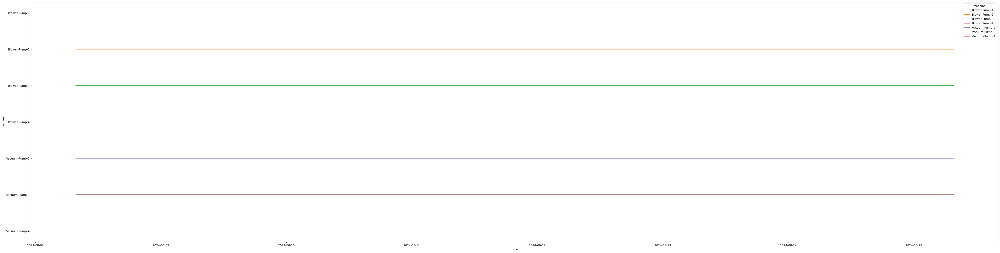

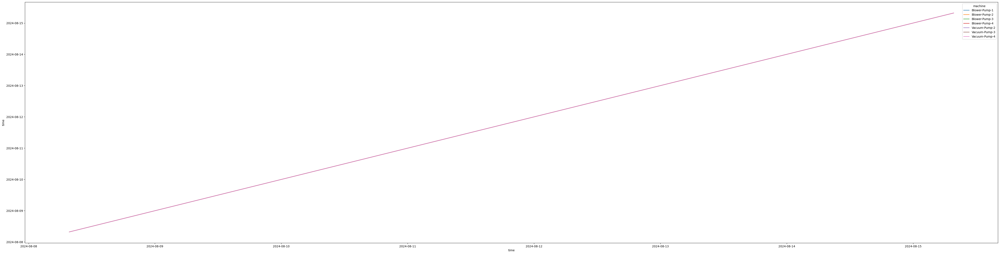

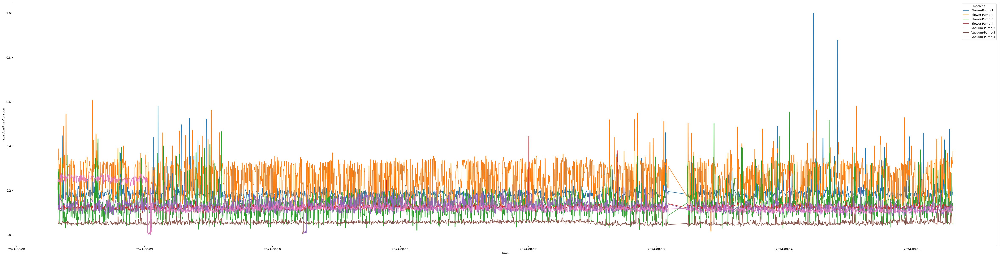

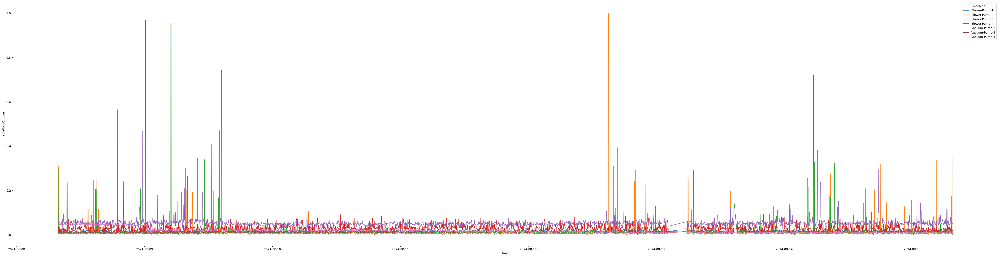

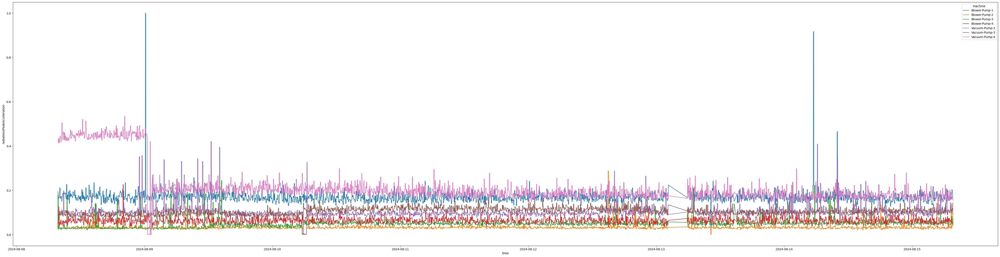

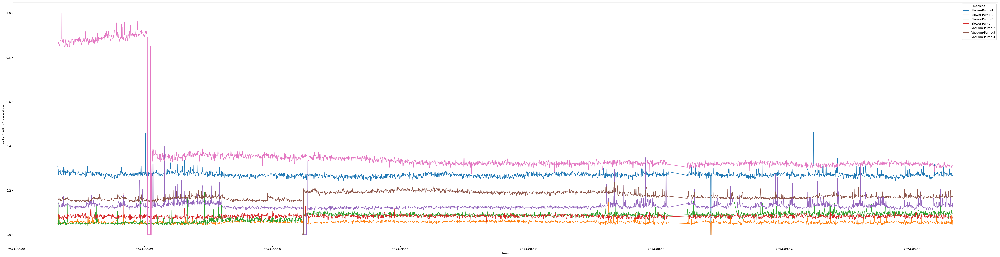

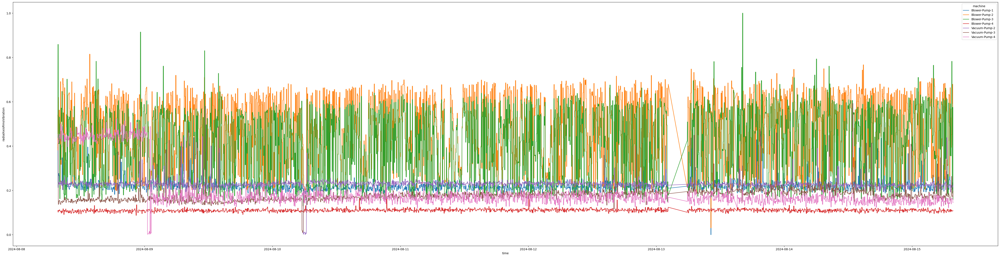

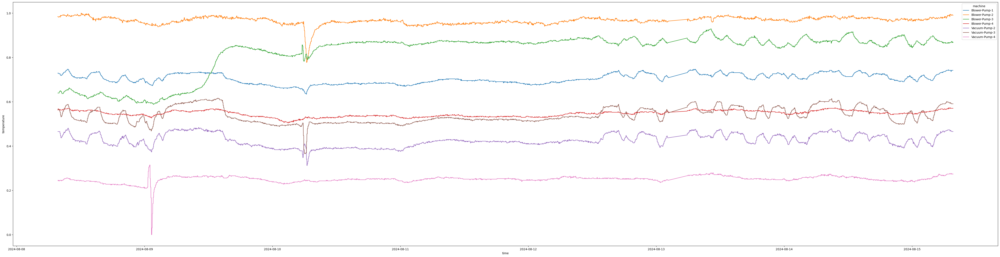

In [38]:
for sensor in df[2:]:
    plt.figure(figsize=(60, 15))
    sns.lineplot(data=scaled_df, x='time', y=sensor, hue='machine', linewidth=1.5)
    plt.show()

axialAxisRmsVibration
radialAxisKurtosis


<Figure size 3000x1000 with 0 Axes>

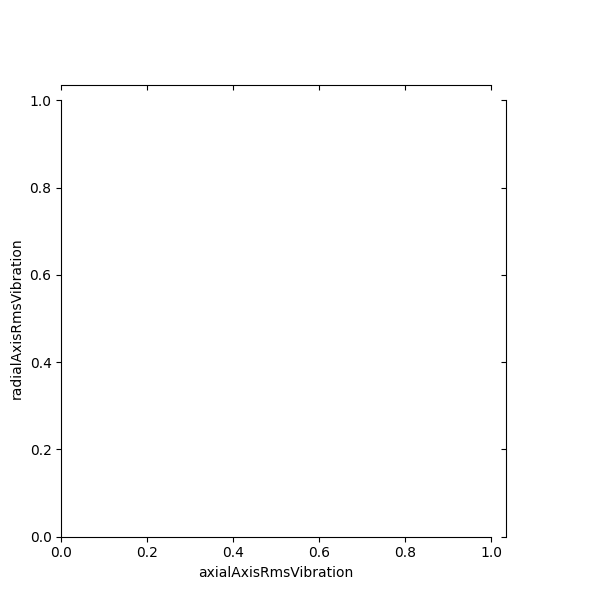

<Figure size 3000x1000 with 0 Axes>

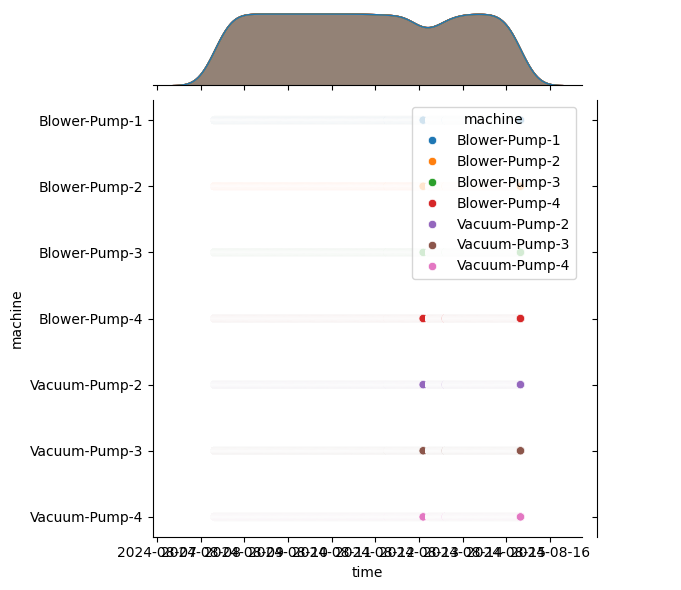

<Figure size 3000x1000 with 0 Axes>

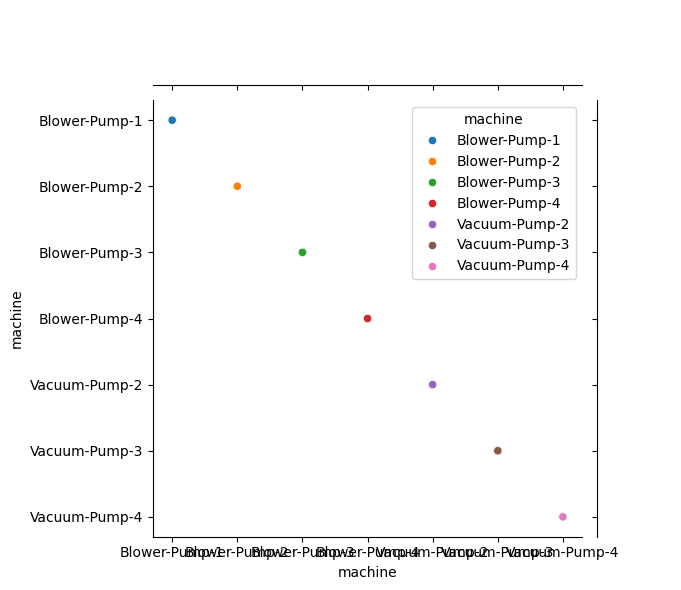

<Figure size 3000x1000 with 0 Axes>

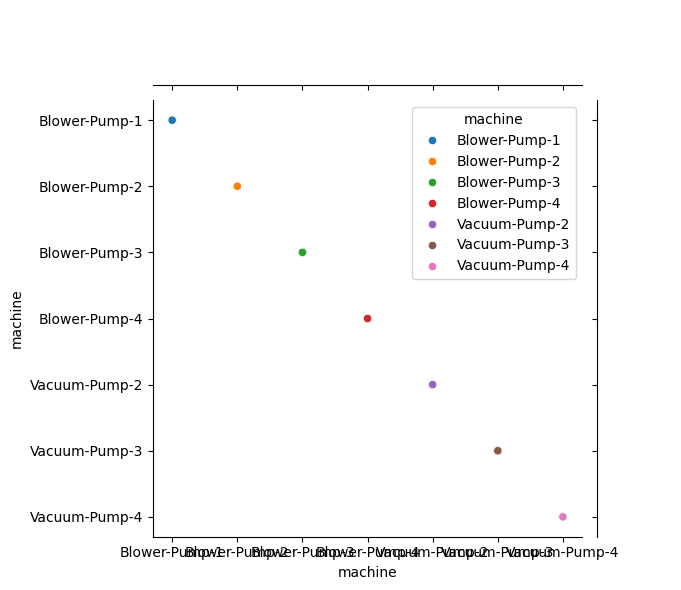

<Figure size 3000x1000 with 0 Axes>

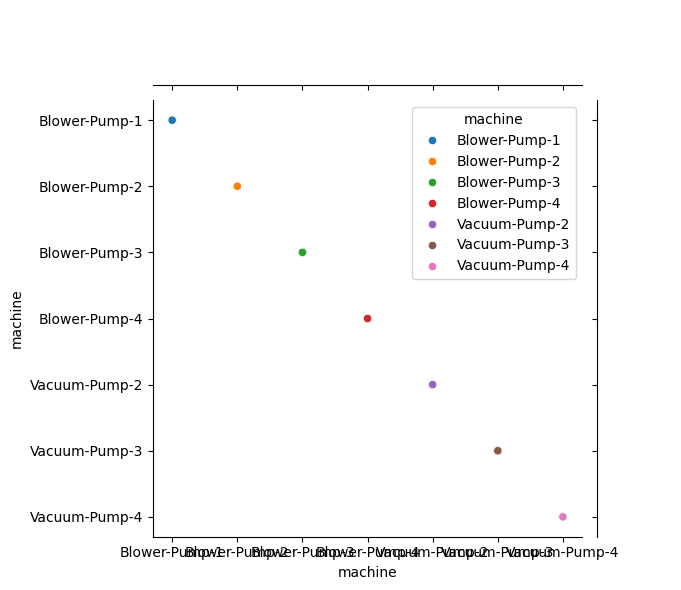

<Figure size 3000x1000 with 0 Axes>

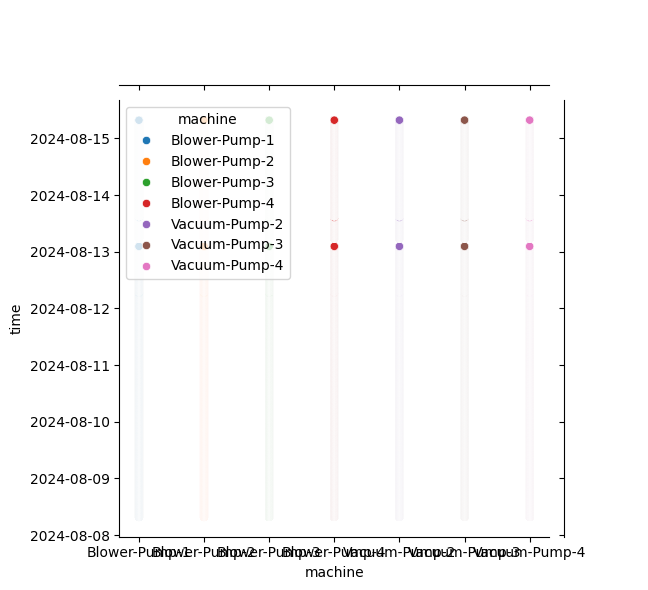

<Figure size 3000x1000 with 0 Axes>

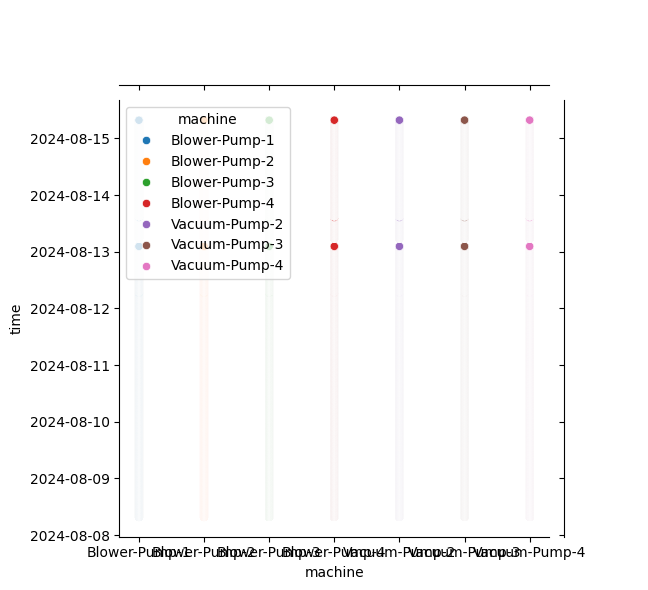

<Figure size 3000x1000 with 0 Axes>

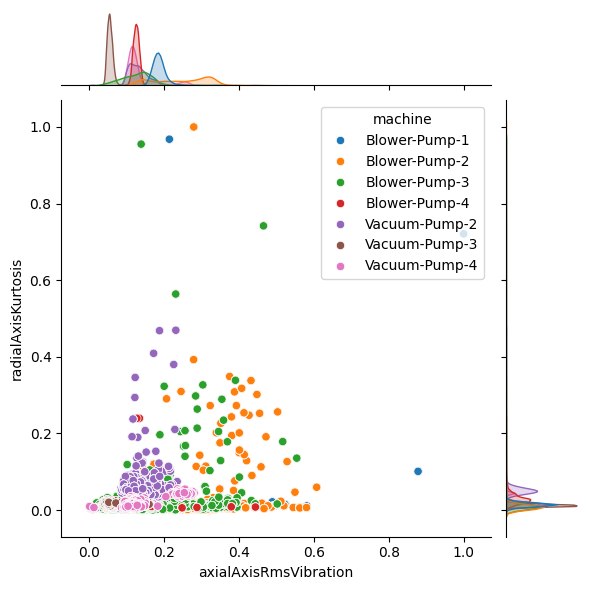

axialAxisRmsVibration
radialAxisPeakAcceleration


<Figure size 3000x1000 with 0 Axes>

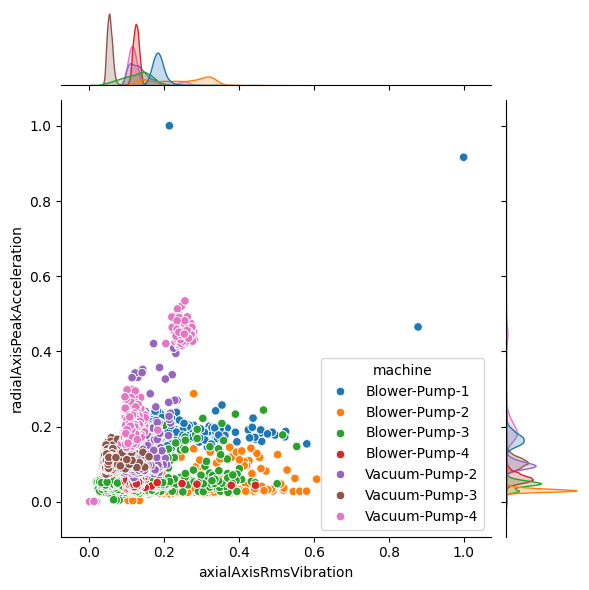

axialAxisRmsVibration
radialAxisRmsAcceleration


<Figure size 3000x1000 with 0 Axes>

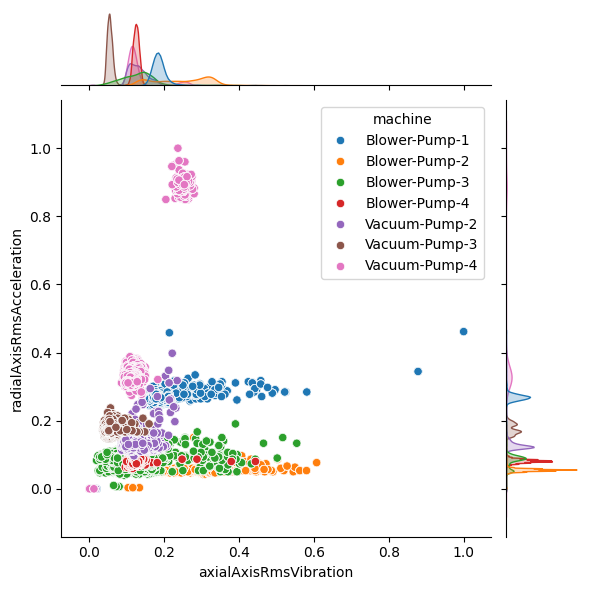

axialAxisRmsVibration
radialAxisRmsVibration


<Figure size 3000x1000 with 0 Axes>

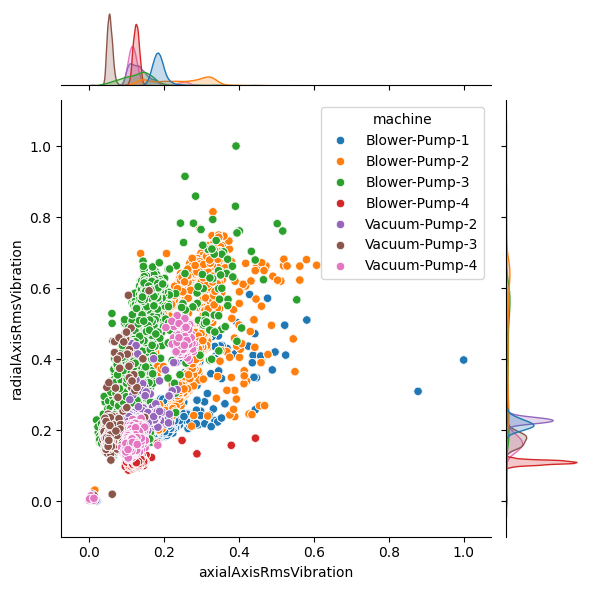

axialAxisRmsVibration
temperature


<Figure size 3000x1000 with 0 Axes>

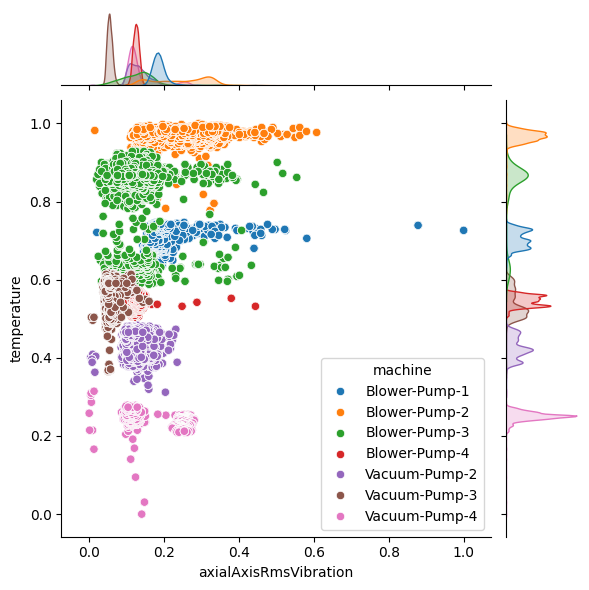

radialAxisKurtosis
axialAxisRmsVibration


<Figure size 3000x1000 with 0 Axes>

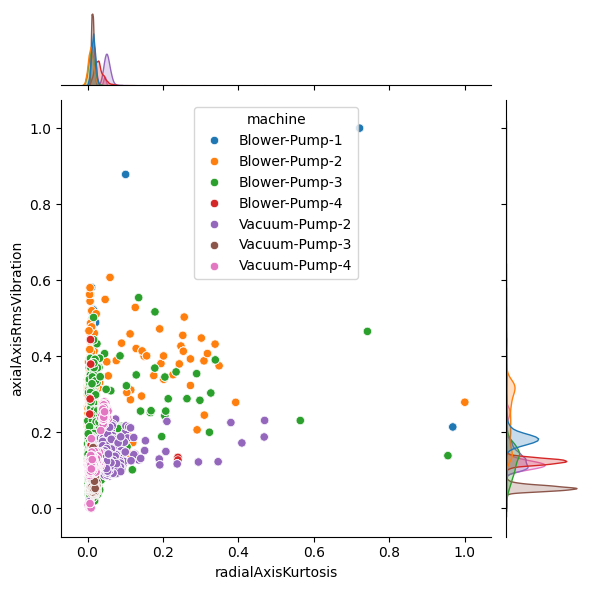

radialAxisKurtosis
radialAxisPeakAcceleration


<Figure size 3000x1000 with 0 Axes>

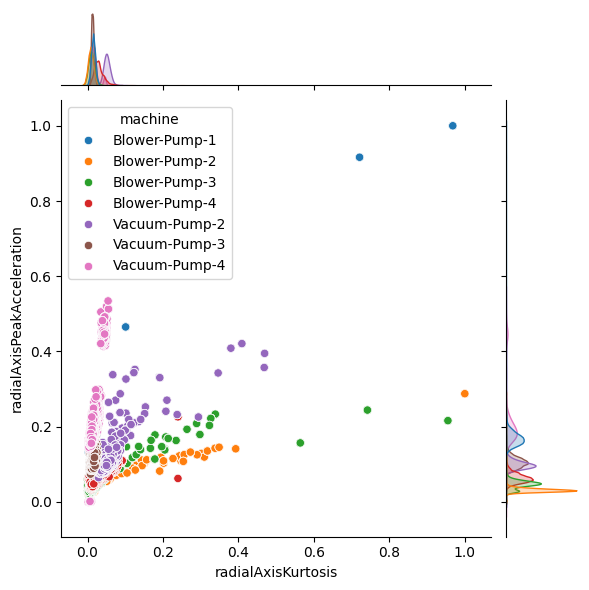

radialAxisKurtosis
radialAxisRmsAcceleration


<Figure size 3000x1000 with 0 Axes>

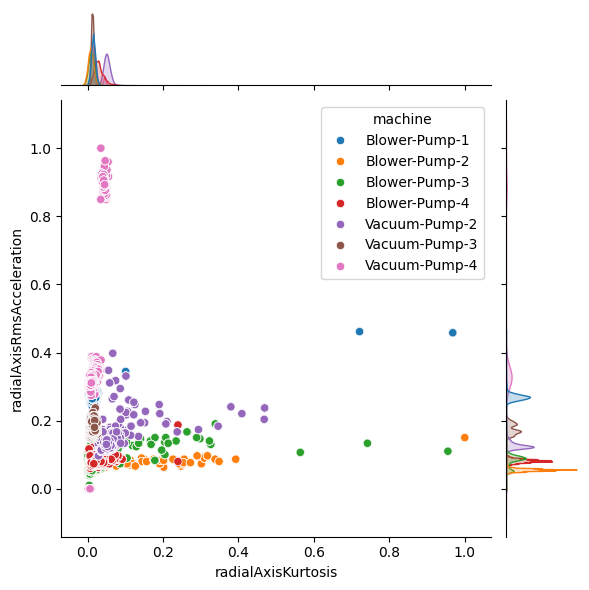

radialAxisKurtosis
radialAxisRmsVibration


<Figure size 3000x1000 with 0 Axes>

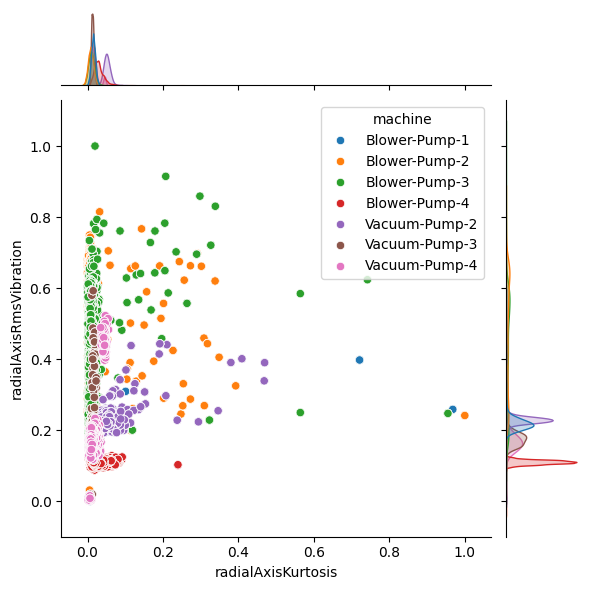

radialAxisKurtosis
temperature


<Figure size 3000x1000 with 0 Axes>

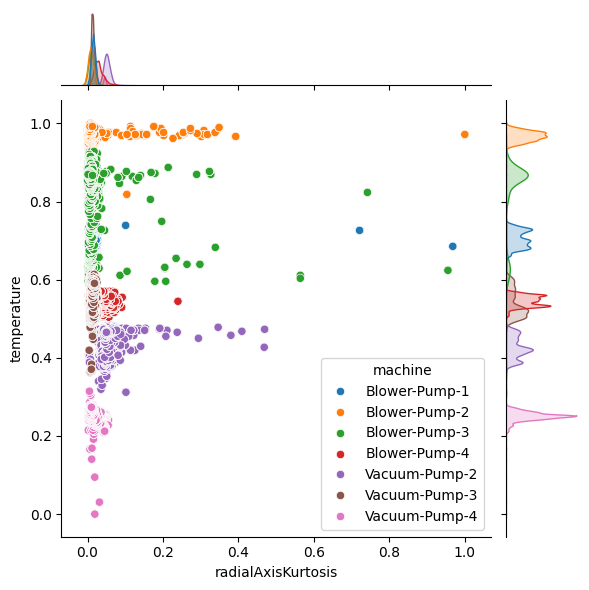

radialAxisPeakAcceleration
axialAxisRmsVibration


<Figure size 3000x1000 with 0 Axes>

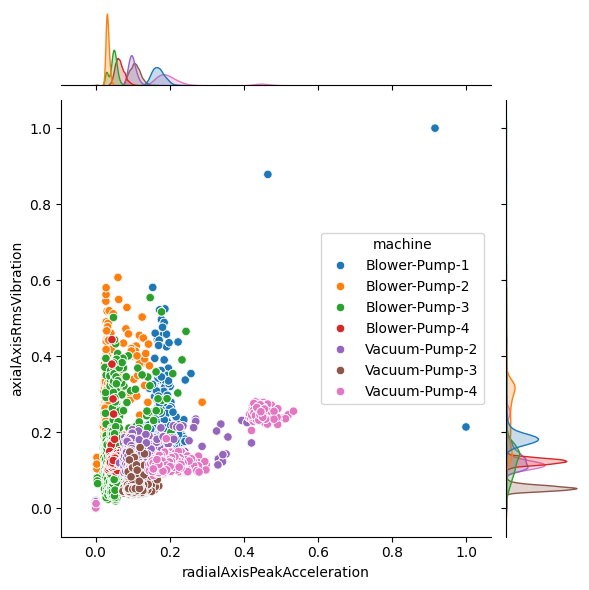

radialAxisPeakAcceleration
radialAxisKurtosis


<Figure size 3000x1000 with 0 Axes>

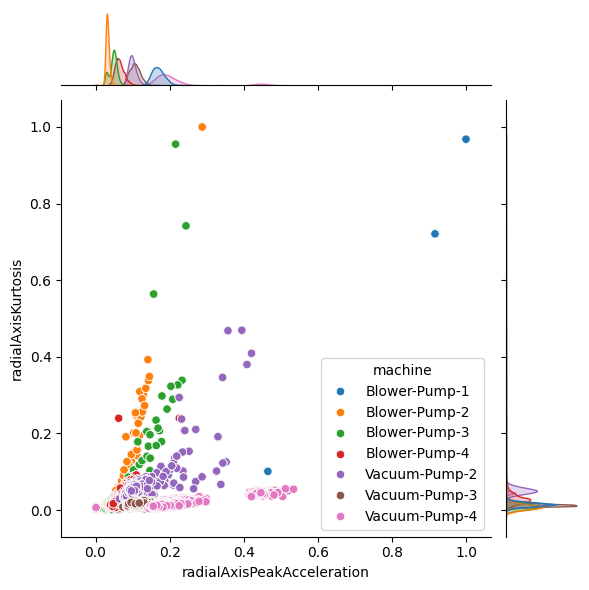

radialAxisPeakAcceleration
radialAxisRmsAcceleration


<Figure size 3000x1000 with 0 Axes>

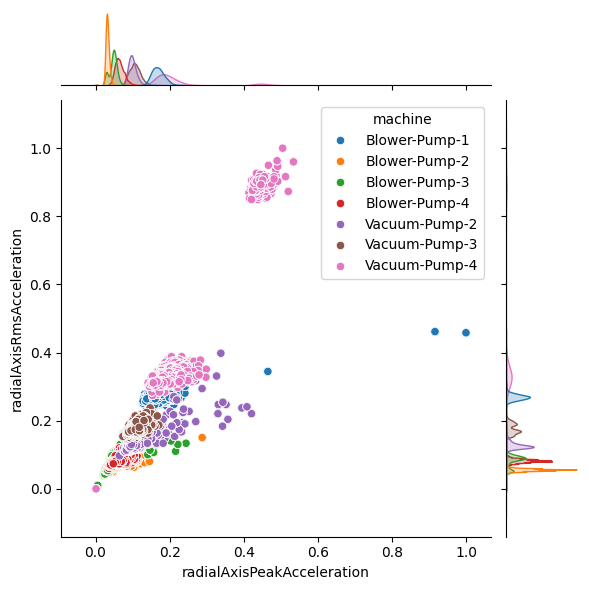

radialAxisPeakAcceleration
radialAxisRmsVibration


<Figure size 3000x1000 with 0 Axes>

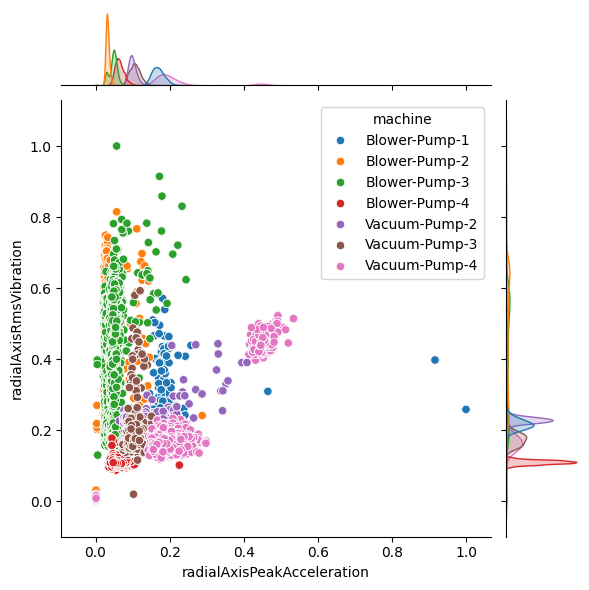

radialAxisPeakAcceleration
temperature


<Figure size 3000x1000 with 0 Axes>

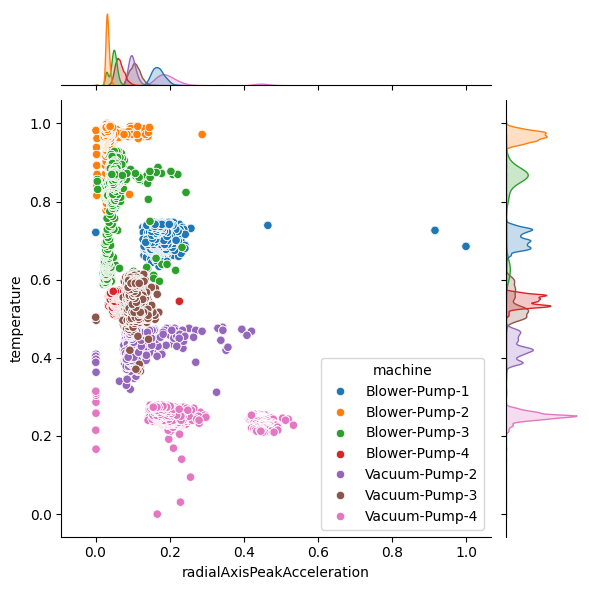

radialAxisRmsAcceleration
axialAxisRmsVibration


<Figure size 3000x1000 with 0 Axes>

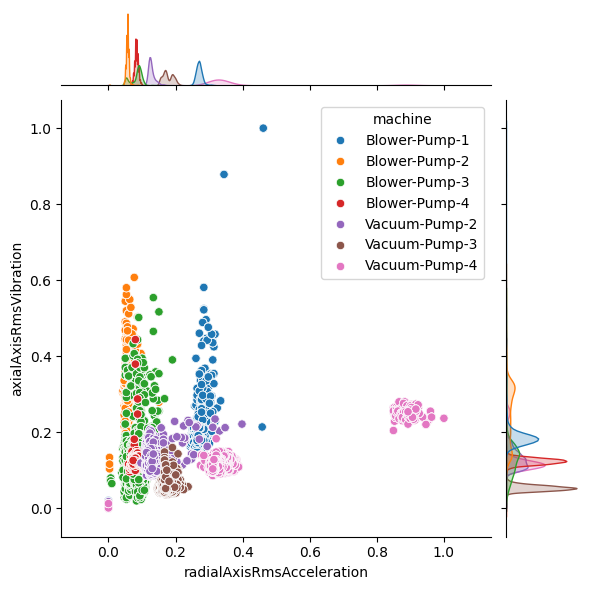

radialAxisRmsAcceleration
radialAxisKurtosis


<Figure size 3000x1000 with 0 Axes>

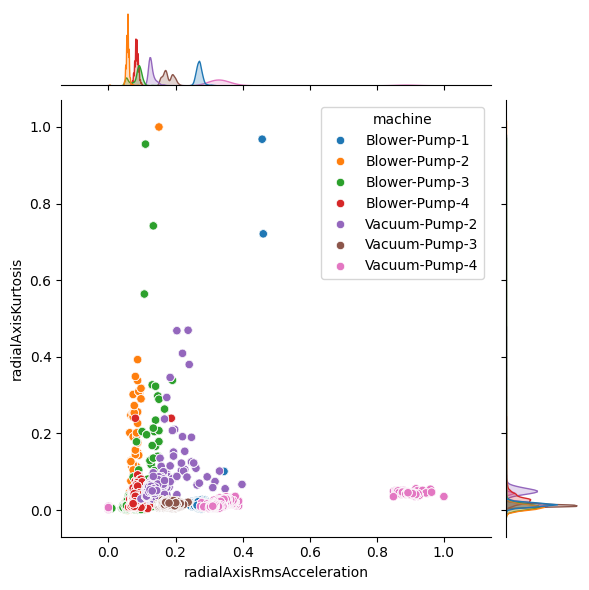

radialAxisRmsAcceleration
radialAxisPeakAcceleration


<Figure size 3000x1000 with 0 Axes>

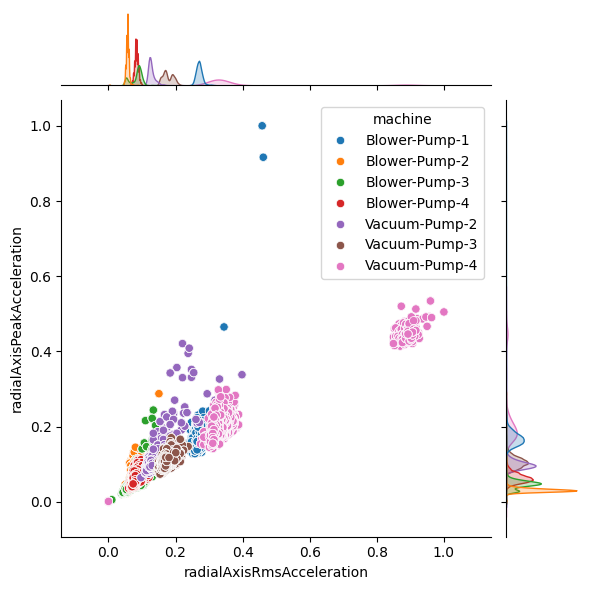

radialAxisRmsAcceleration
radialAxisRmsVibration


<Figure size 3000x1000 with 0 Axes>

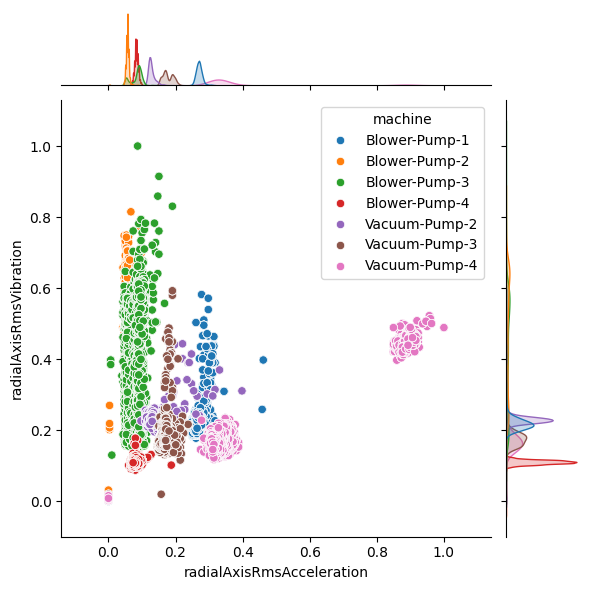

radialAxisRmsAcceleration
temperature


<Figure size 3000x1000 with 0 Axes>

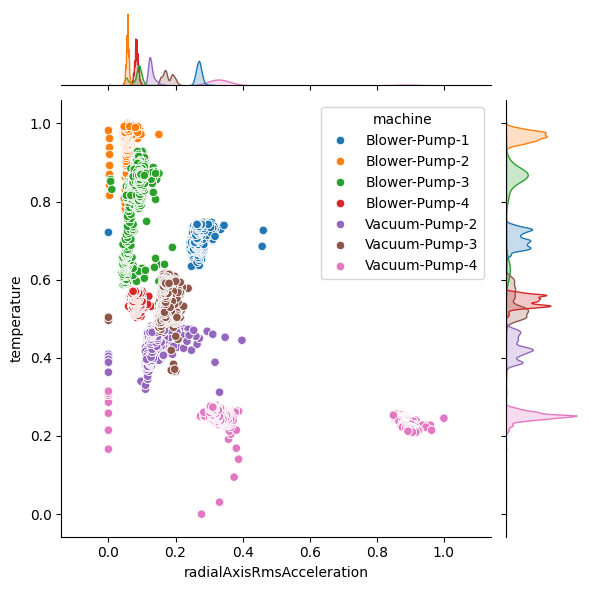

radialAxisRmsVibration
axialAxisRmsVibration


<Figure size 3000x1000 with 0 Axes>

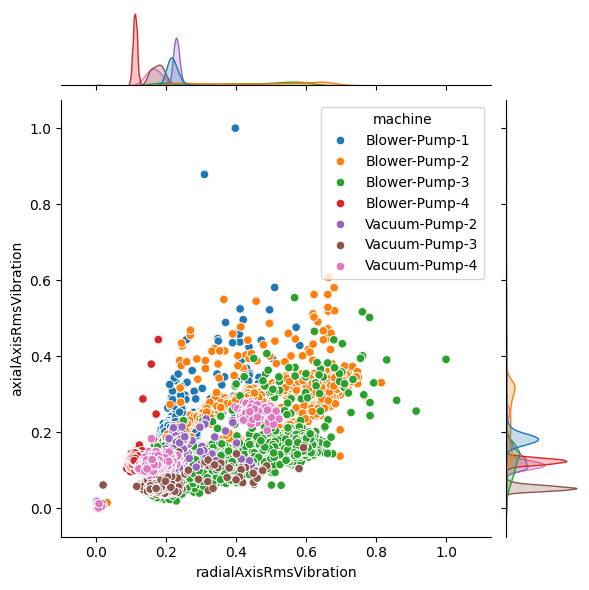

radialAxisRmsVibration
radialAxisKurtosis


<Figure size 3000x1000 with 0 Axes>

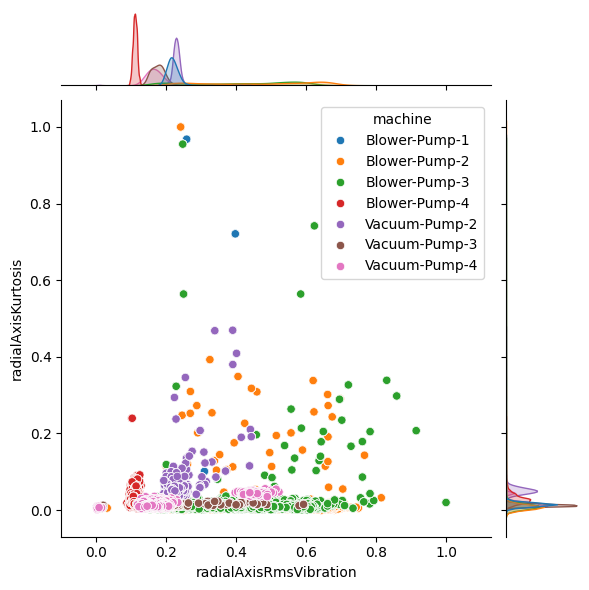

radialAxisRmsVibration
radialAxisPeakAcceleration


<Figure size 3000x1000 with 0 Axes>

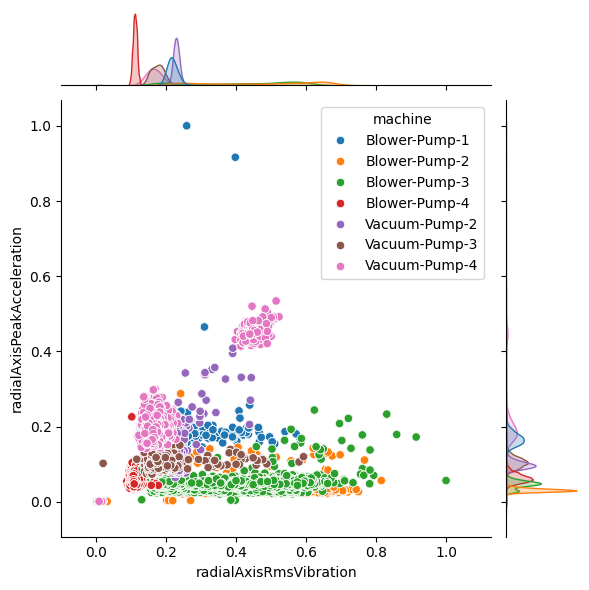

radialAxisRmsVibration
radialAxisRmsAcceleration


<Figure size 3000x1000 with 0 Axes>

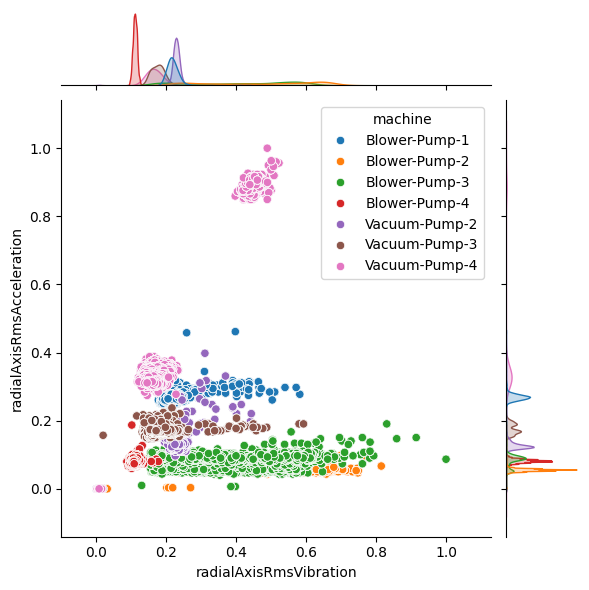

radialAxisRmsVibration
temperature


<Figure size 3000x1000 with 0 Axes>

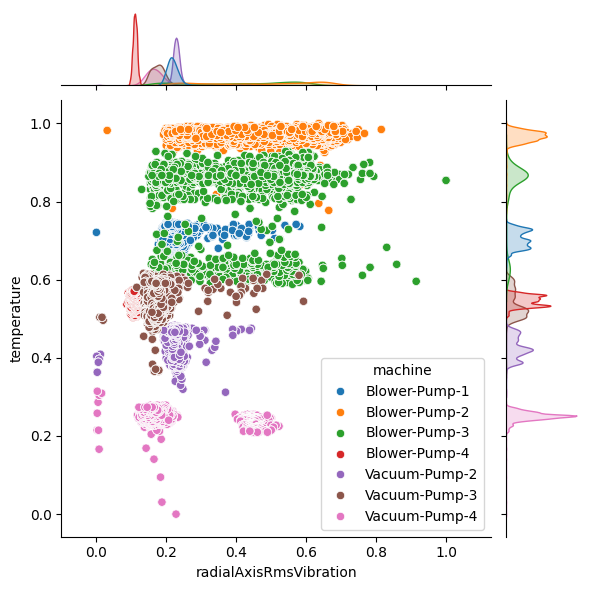

temperature
axialAxisRmsVibration


<Figure size 3000x1000 with 0 Axes>

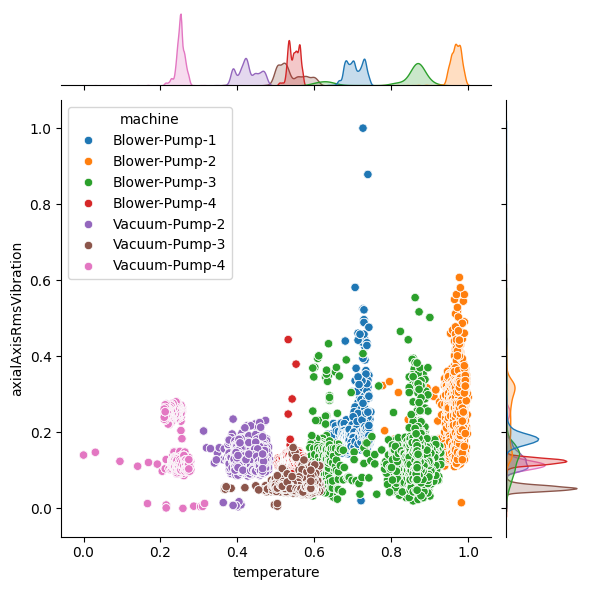

temperature
radialAxisKurtosis


<Figure size 3000x1000 with 0 Axes>

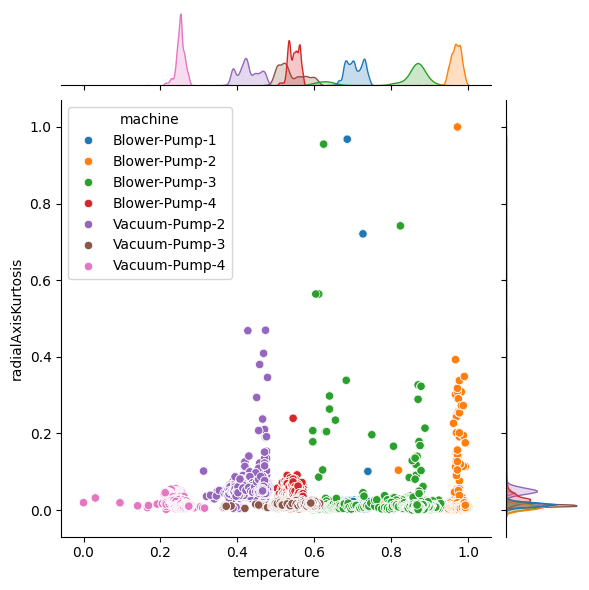

temperature
radialAxisPeakAcceleration


<Figure size 3000x1000 with 0 Axes>

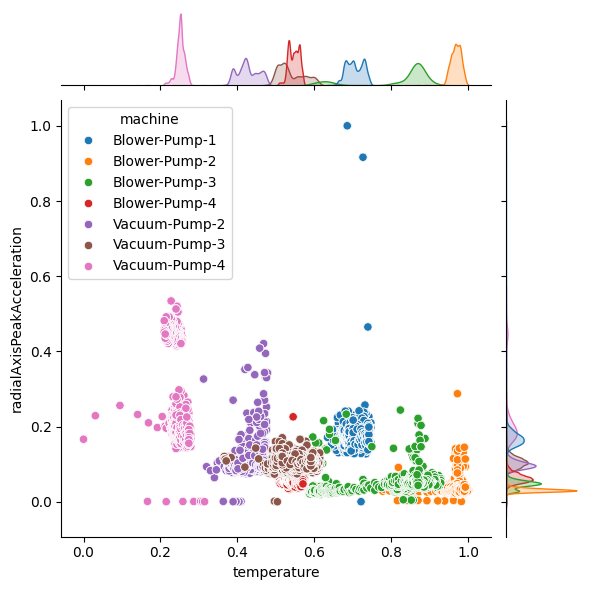

temperature
radialAxisRmsAcceleration


<Figure size 3000x1000 with 0 Axes>

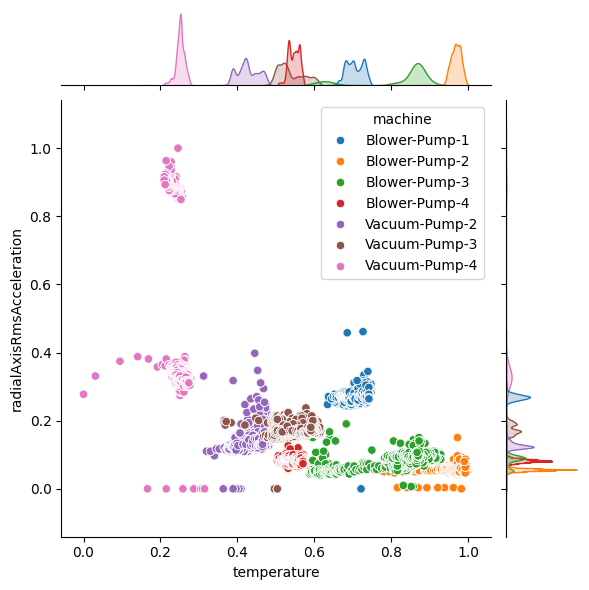

temperature
radialAxisRmsVibration


<Figure size 3000x1000 with 0 Axes>

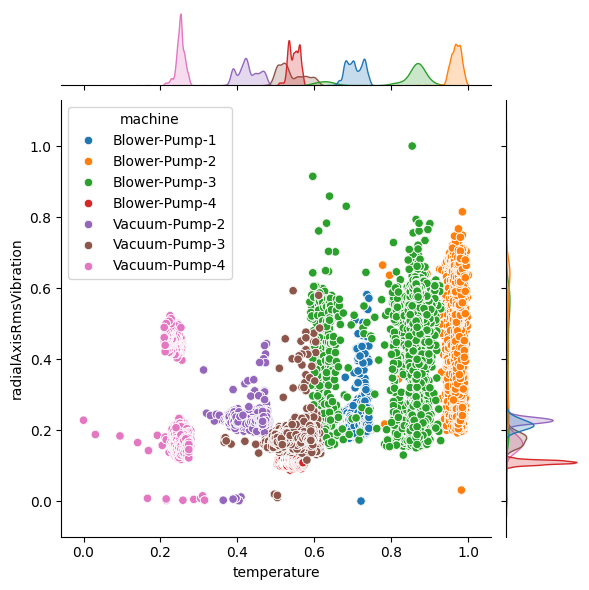

In [53]:
numerical_columns = []
for col in df.columns:
    if df[col].dtype == 'float64':
        numerical_columns.append(col)

for sensor1 in df[numerical_columns]:
    if sensor1 != 'time' or sensor1 != 'machine':
        for sensor2 in df[numerical_columns]:
            if sensor1 != sensor2 and (sensor2 != 'time' or sensor2 != 'machine'):
                plt.figure(figsize=(30, 10))
                sns.jointplot(data=df, x=sensor1, y=sensor2, hue='machine', kind='scatter')
                plt.show()